### Post3 : Bayesian Quest Object Detection Notebook - Implementing the Image Pyramids classification and object detection

We will be covering the following processes when we are building the object detector from the scratch

**1. Build the train and test sets from the annotated images using HOG  feature extraction techniques** ( Refer post 2 :https://bayesianquest.com/2022/04/07/build-you-computer-vision-application-part-ii-data-preperation-and-annotation/)

**2. Save the features and labels in hdf5 format** ( Post 2 )

**3. Build a classifier for detecting potholes using SVM classifier** ( Post 3)

**4. Introduction to image pyramids and sliding window techniques to predict bounding boxes for potholes during inference process** ( Post 3)

**5. Optimise the bounding boxes using Non Maxima suppression.** ( Post 3)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import glob
import pandas as pd
import io
import cv2
from skimage import feature
import skimage
from sklearn.feature_extraction.image import extract_patches_2d
from sklearn.svm import SVC
import numpy as np
import argparse
import pickle
import matplotlib.pyplot as plt
from random import sample
%matplotlib inline

In [ ]:
basePath = '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/'

In [ ]:
# Positive Images
path = basePath + 'data'
allFiles = glob.glob(path + '/*.jpeg')
print(len(allFiles))
allFiles

19


['/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/pothole1.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/pothole2.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/pothole3.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/pothole4.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/pothole5.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/pothole6.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/pothole7.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/pothole8.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/pothole9.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/pothole10.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/pothole11.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-Obj

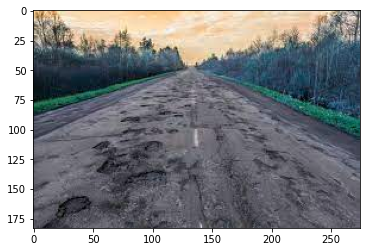

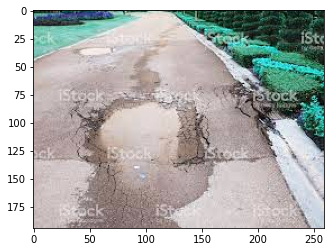

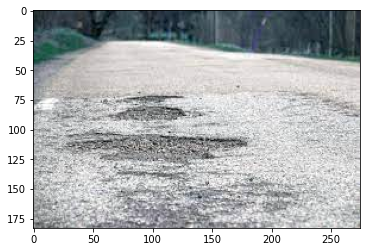

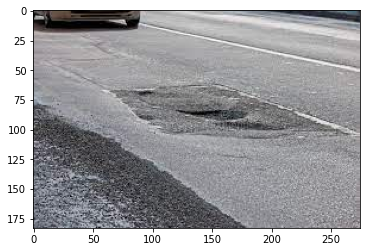

In [ ]:
for imgPath in allFiles[:4]:
    img = cv2.imread(imgPath)
    plt.imshow(img)
    plt.show()
    

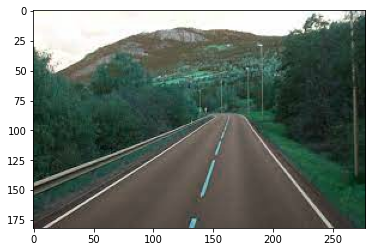

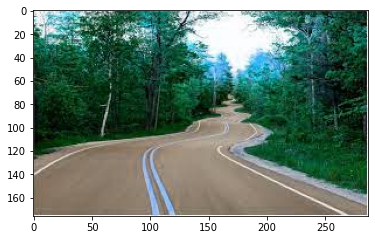

In [ ]:
# Negative images
path = basePath +  'data/Annotated'
roadFiles = glob.glob(path + '/*.jpeg')
for imgPath in roadFiles[:2]:
    img = cv2.imread(imgPath)
    plt.imshow(img)
    plt.show()

#### **Building the classifier**

In [ ]:
# Read the data base from disk
db = h5py.File(outputPath, "r")
# Extract the labels and data
(labels, data) = (db["pothole_features_all"][:, 0], db["pothole_features_all"][:, 1:])
# Close the data base
db.close()

print(labels.shape)
print(data.shape)

(730,)
(730, 8208)


In [ ]:
model = SVC(kernel="linear", C=0.01, probability=True, random_state=42)
model.fit(data, labels)

SVC(C=0.01, kernel='linear', probability=True, random_state=42)

In [ ]:
# Save the model in the output folder
modelPath = 'data/models/model.cpickle'
f = open(modelPath, "wb")
f.write(pickle.dumps(model))
f.close()

#### **Image Pyramid**

In [ ]:
from skimage.transform import pyramid_gaussian

(183, 275, 3)


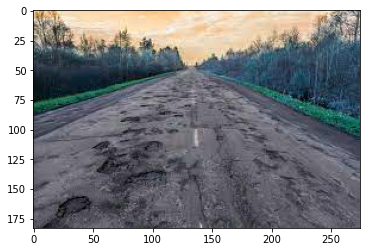

(153, 230, 3)


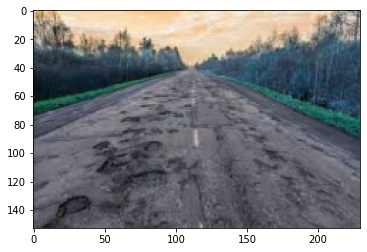

(128, 192, 3)


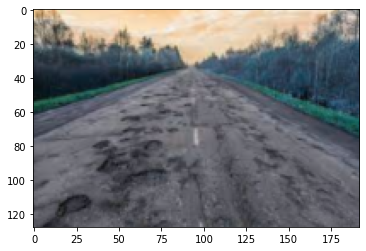

(107, 160, 3)


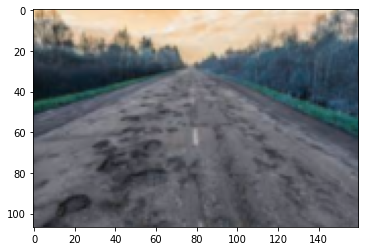

(90, 134, 3)


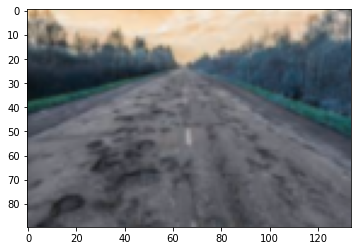

(75, 112, 3)


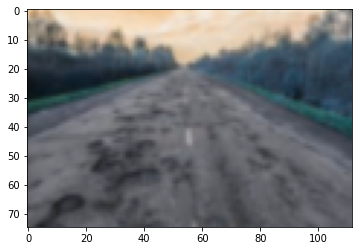

(63, 94, 3)


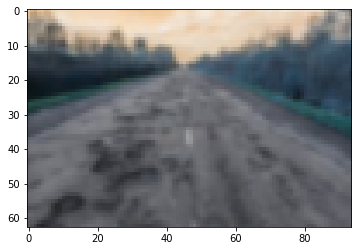

In [ ]:

for imgPath in allFiles[0:1]:
    # Read the image
    image = cv2.imread(imgPath)
    # loop over the layers of the image pyramid and display them
    for (i, layer) in enumerate(pyramid_gaussian(image, downscale=1.2)):
        # Break the loop if the image size is less than our window size
        if layer.shape[1] < 80 or layer.shape[0] < 40:
            break
        print(layer.shape)
        plt.imshow(layer,aspect='equal')
        plt.show()

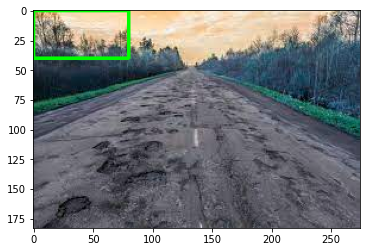

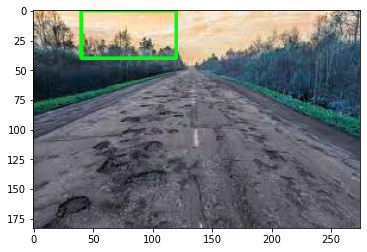

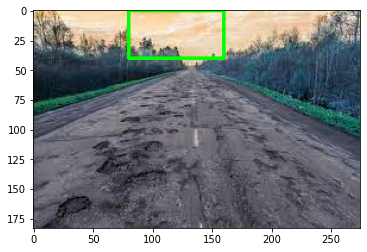

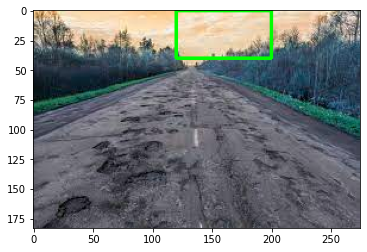

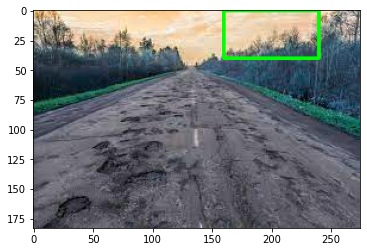

...

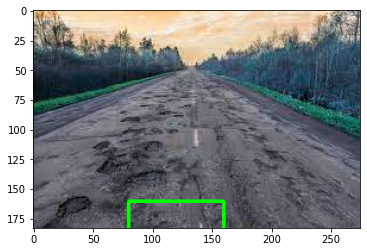

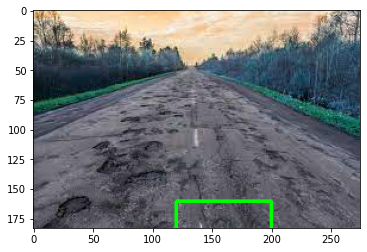

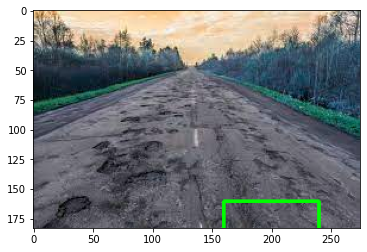

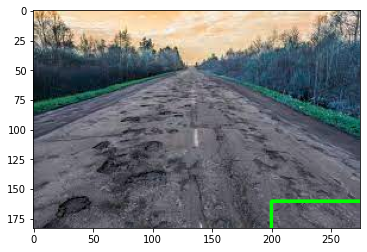

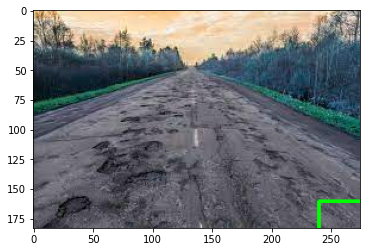

In [ ]:
# Read the image
image = cv2.imread(allFiles[0])
# Define the window size
windowSize = [80,40]
# Define the step size
stepSize = 40
# slide a window across the image
for y in range(0, image.shape[0], stepSize):
    for x in range(0, image.shape[1], stepSize):
        # Get an image window
        clone = image.copy()
        cv2.rectangle(clone, (x, y), (x + windowSize[0], y + windowSize[1]), (0, 255, 0), 2)
        plt.imshow(clone,aspect='equal')
        plt.show()       
        

In [ ]:
# Function to implement sliding window
def slidingWindow(image, stepSize, windowSize):    
    # slide a window across the image
    for y in range(0, image.shape[0], stepSize):
        for x in range(0, image.shape[1], stepSize):
            # yield the current window
            yield (x, y, image[y:y + windowSize[1], x:x + windowSize[0]])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


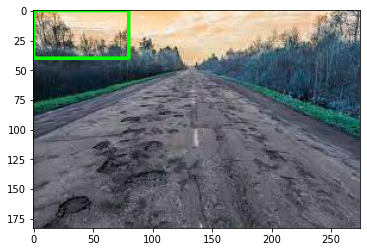

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


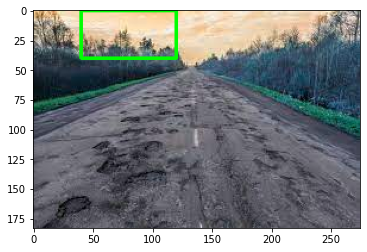

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


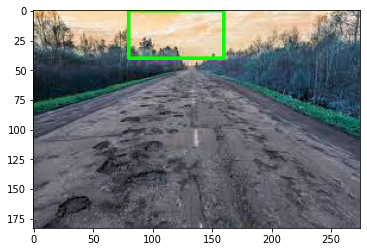

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


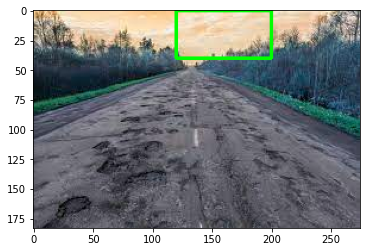

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


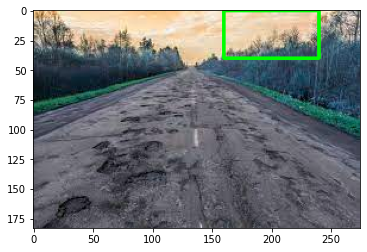

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


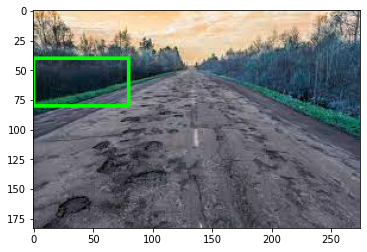

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


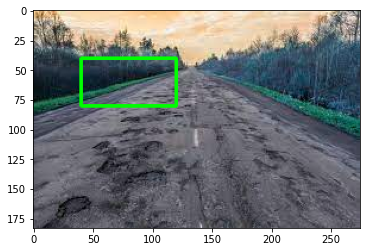

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


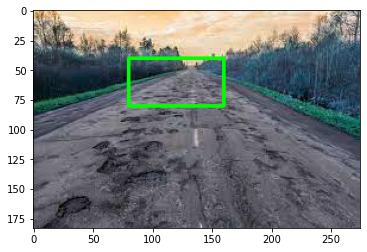

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


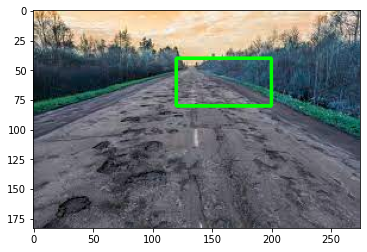

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


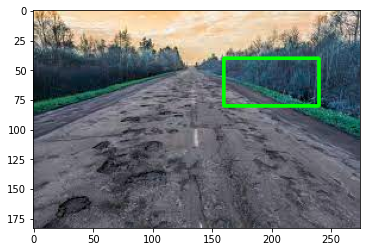

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


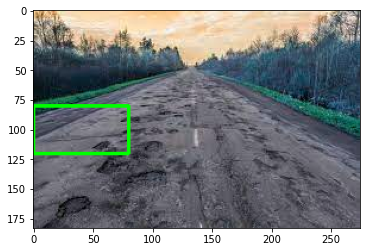

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


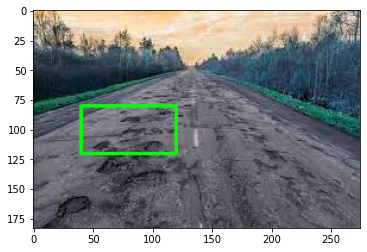

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


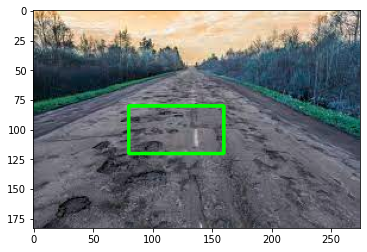

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


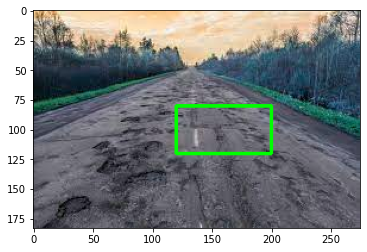

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


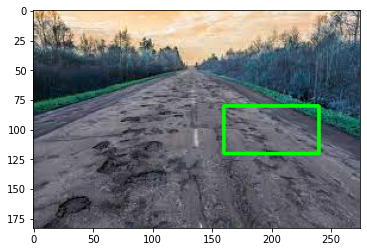

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


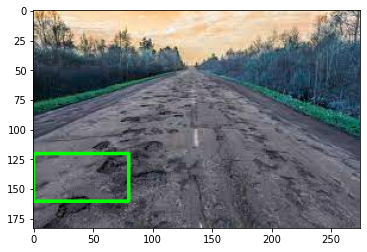

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


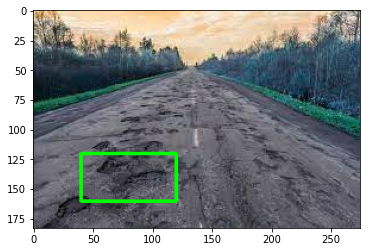

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


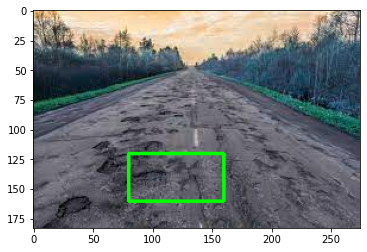

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


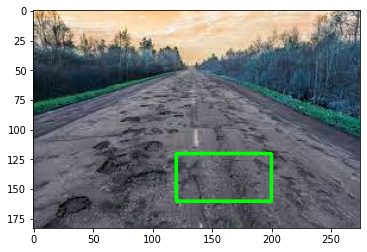

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


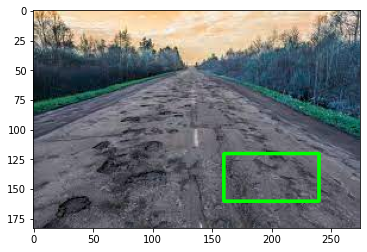

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


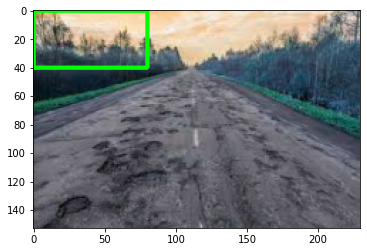

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


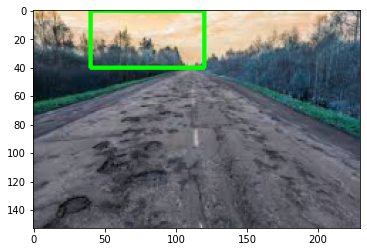

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


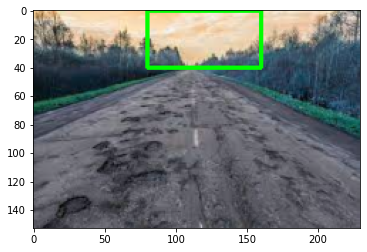

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


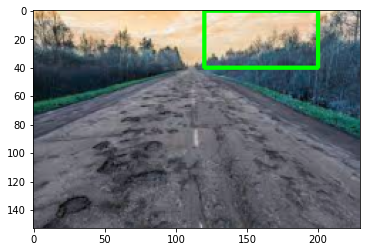

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


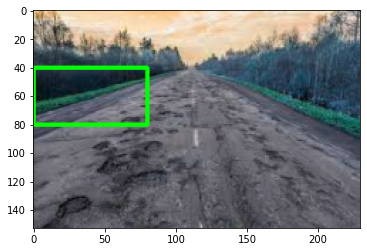

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


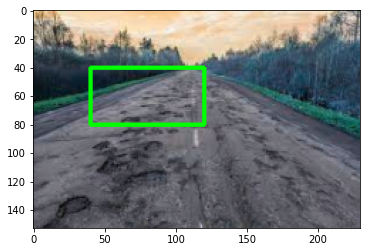

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


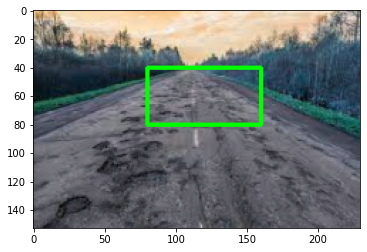

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


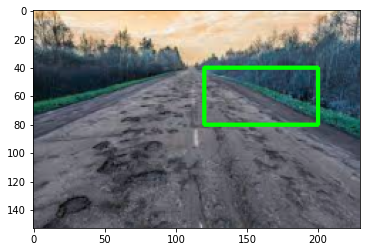

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


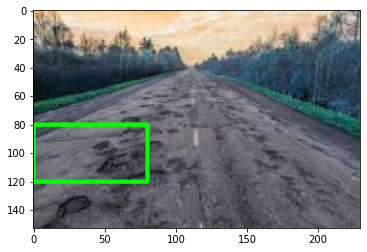

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


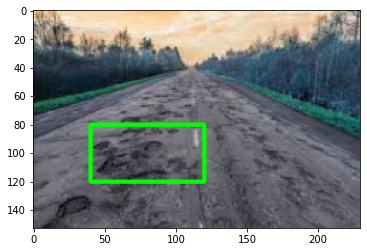

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


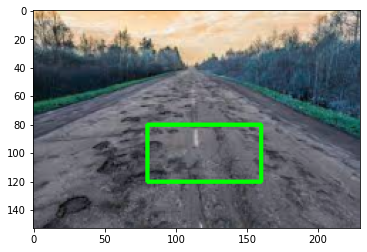

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


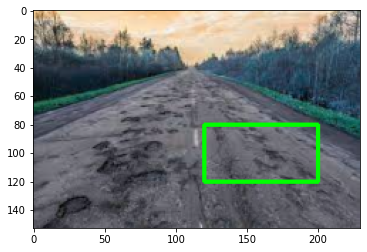

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


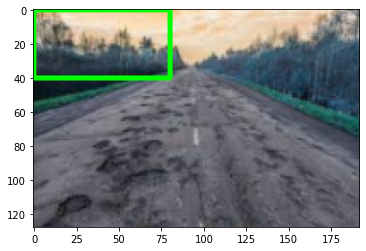

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


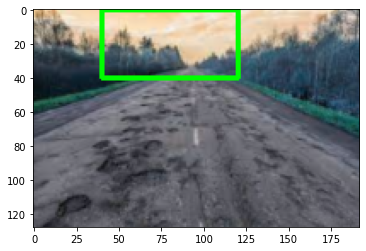

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


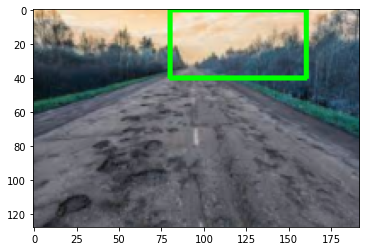

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


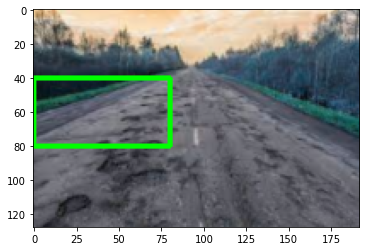

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


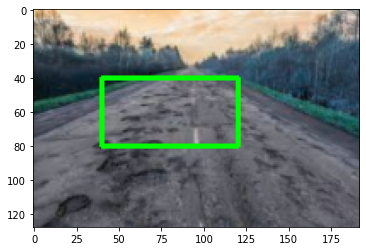

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


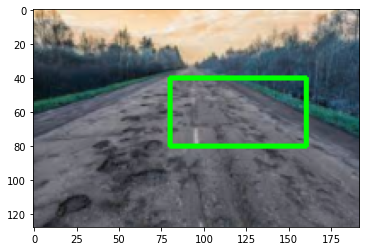

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


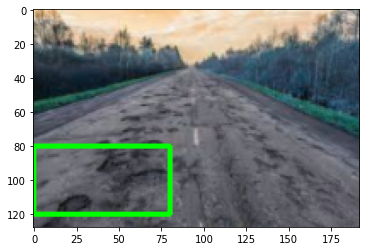

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


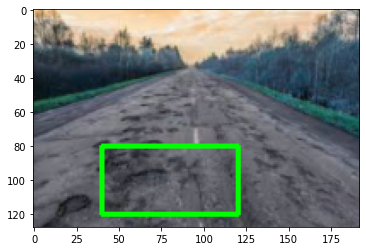

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


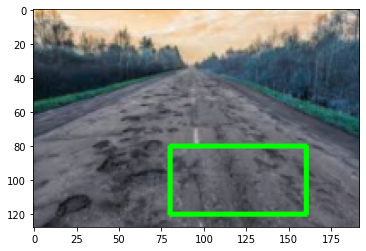

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


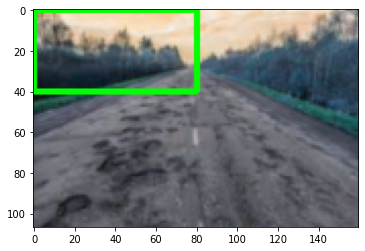

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


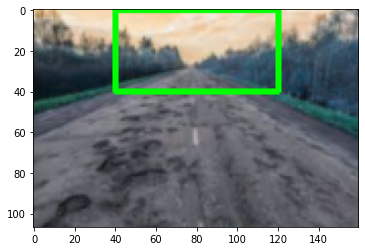

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


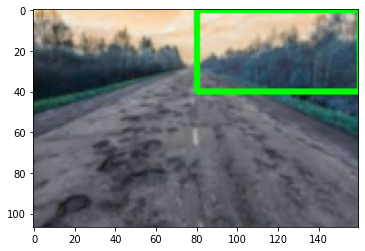

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


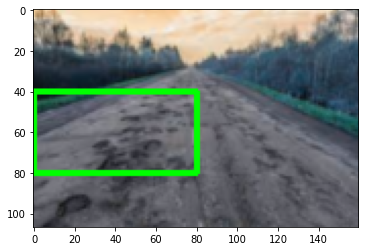

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


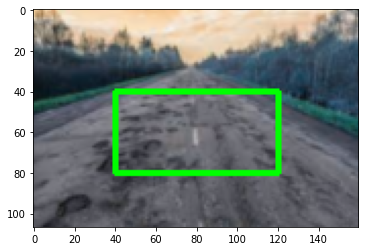

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


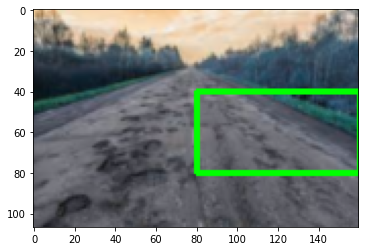

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


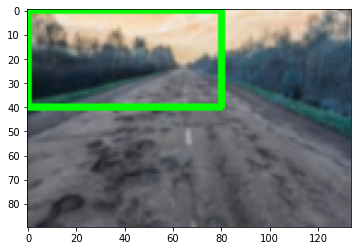

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


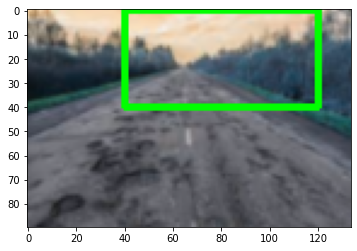

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


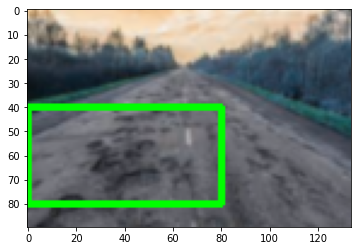

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


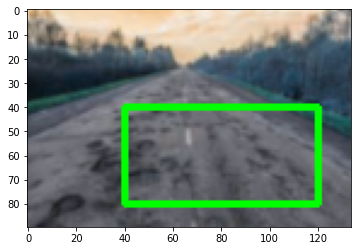

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


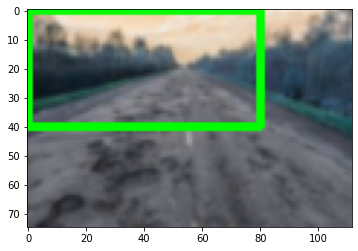

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


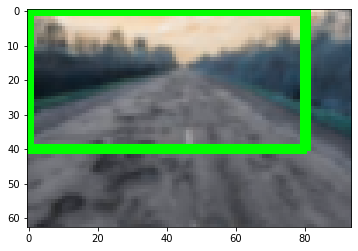

In [ ]:
# load the input image and unpack the command line arguments
for imgPath in allFiles[0:1]:
    image = cv2.imread(imgPath)
    #print('image shape',image.shape)
    # loop over the image pyramid
    for (i, layer) in enumerate(pyramid_gaussian(image, downscale=1.2)):
        #print('layer shape',layer.shape)
        # loop over the sliding window for each layer of the pyramid
        for (x, y, window) in slidingWindow(layer, stepSize=40, windowSize=(80,40)):
            #print('window shape',window.shape)
            # if the current window does not meet our desired window size, ignore it
            if window.shape[0] != 40 or window.shape[1] != 80:
                continue
            # THIS IS WHERE WE WOULD PROCESS THE WINDOW, EXTRACT HOG FEATURES, AND
            # APPLY A MACHINE LEARNING CLASSIFIER TO PERFORM OBJECT DETECTION
            # since we do not have a classifier yet, let's just draw the window
            clone = layer.copy()
            cv2.rectangle(clone, (x, y), (x + windowSize[0], y + windowSize[1]), (0, 255, 0), 2)
            plt.imshow(clone,aspect='equal')
            plt.show()       
            

### **Object Detection**



In [ ]:
modelPath = basePath +'data/models/model.cpickle'
# Loading the model we trained earlier
model = pickle.loads(open(modelPath, "rb").read())
model

In [ ]:
testpath = basePath + 'data/test'
testFiles = glob.glob(testpath + '/*.jpeg')
testFiles

['/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/test/images1.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/test/images2.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/test/images3.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/test/images4.jpeg',
 '/content/drive/MyDrive/Bayesian Quest/JMJTL-BQ-ObjectDetection/data/test/images5.jpeg']

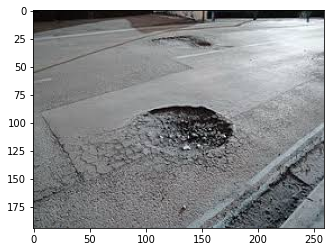

In [ ]:
tstimage = cv2.imread(testFiles[2])
plt.imshow(tstimage,aspect='equal')
plt.show()

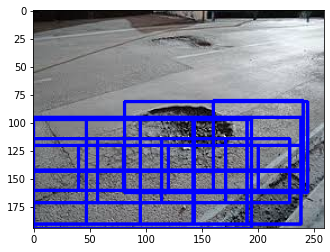

In [ ]:
# Initialise lists to store the bounding boxes and probabilities
boxes = []
probs = []
# Define the HOG parameters
orientations=12
pixelsPerCell=(4, 4)
cellsPerBlock=(2, 2)
# Define the fixed window size
windowSize=(80,40)
# Pick a random image from the image path to check our prediction
#imgPath = sample(allFiles,1)[0]
imgPath = sample(testFiles,1)[0]
#for imgPath in imPaths:
# Read the image
image = cv2.imread(imgPath)
# Converting the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# loop over the image pyramid
for (i, layer) in enumerate(pyramid_gaussian(image, downscale=1.2)):
    # Identify the current scale of the image    
    scale = gray.shape[0] / float(layer.shape[0])
    # loop over the sliding window for each layer of the pyramid
    for (x, y, window) in slidingWindow(layer, stepSize=40, windowSize=(80,40)):
        # if the current window does not meet our desired window size, ignore it
        if window.shape[0] != windowSize[1] or window.shape[1] != windowSize[0]:
            continue
        # Let us now extract the hog features of this window within the image
        feat = hogFeatures(window,orientations,pixelsPerCell,cellsPerBlock,normalize=True).reshape(1,-1)
        # Get the prediction probabilities for the positive class ( potholesf)
        prob = model.predict_proba(feat)[0][1] 

        # Check if the probability is greater than a threshold probability
        if prob > 0.90:            
            # Extract (x, y)-coordinates of the bounding box using the current scale 
            # Starting coordinates
            (startX, startY) = (int(scale * x), int(scale * y))
            # Ending coordinates
            endX = int(startX + (scale * windowSize[0]))
            endY = int(startY + (scale * windowSize[1]))
            # update the list of bounding boxes and probabilities
            boxes.append((startX, startY, endX, endY))
            probs.append(prob)

# loop over the bounding boxes and draw them
for (startX, startY, endX, endY) in boxes:
    cv2.rectangle(image, (startX, startY), (endX, endY), (0, 0, 255), 2)       

plt.imshow(image,aspect='equal')
plt.show() 


In [ ]:
def maxOverlap(boxes):
    '''
    boxes : This is the cordinates of the boxes which have the object
    returns : A list of boxes which do not have much overlap
    '''
    # Convert the bounding boxes into an array
    boxes = np.array(boxes)
    # Initialise a box to pick the ids of the selected boxes and include the largest box
    selected = []
    # Continue the loop till the number of ids remaining in the box is greater than 1
    while len(boxes) > 1:
        # First calculate the area of the bounding boxes 
        x1 = boxes[:, 0]
        y1 = boxes[:, 1]
        x2 = boxes[:, 2]
        y2 = boxes[:, 3]
        area = (x2 - x1) * (y2 - y1)
        # Sort the bounding boxes based on its area    
        ids = np.argsort(area)
        #print('ids',ids)
        # Take the coordinates of the box with the largest area
        lx1 = boxes[ids[-1], 0]
        ly1 = boxes[ids[-1], 1]
        lx2 = boxes[ids[-1], 2]
        ly2 = boxes[ids[-1], 3]
        # Include the largest box into the selected list
        selected.append(boxes[ids[-1]].tolist())
        # Initialise a list for getting those ids that needs to be removed.
        remove = []
        remove.append(ids[-1])
        # We loop through each of the other boxes and find the overlap of the boxes with the largest box
        for id in ids[:-1]:
            #print('id',id)
            # The maximum of the starting x cordinate is where the overlap along width starts
            ox1 = np.maximum(lx1, boxes[id,0])
            # The maximum of the starting y cordinate is where the overlap along height starts
            oy1 = np.maximum(ly1, boxes[id,1])
            # The minimum of the ending x cordinate is where the overlap along width ends
            ox2 = np.minimum(lx2, boxes[id,2])
            # The minimum of the ending y cordinate is where the overlap along height ends
            oy2 = np.minimum(ly2, boxes[id,3])
            # Find area of the overlapping coordinates
            oa = (ox2 - ox1) * (oy2 - oy1)
            # Find the ratio of overlapping area of the smaller box with respect to its original area
            olRatio = oa/area[id]            
            # If the overlap is greater than threshold include the id in the remove list
            if olRatio > 0.50:
                remove.append(id)                
        # Remove those ids from the original boxes
        boxes = np.delete(boxes, remove,axis = 0)
        # Break the while loop if nothing to remove
        if len(remove) == 0:
            break
    # Append the remaining boxes to the selected
    for i in range(len(boxes)):
        selected.append(boxes[i].tolist())
    return np.array(selected)
        
    
    

In [ ]:
print(len(boxes))
selected = maxOverlap(boxes)
len(selected)

19


3

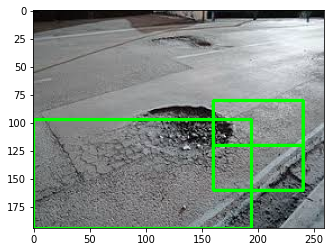

In [ ]:
for (startX, startY, endX, endY) in selected:
    cv2.rectangle(clone, (startX, startY), (endX, endY), (0, 255, 0), 2)       

plt.imshow(clone,aspect='equal')
plt.show() 